# Part I: Theory Questions

## MLE

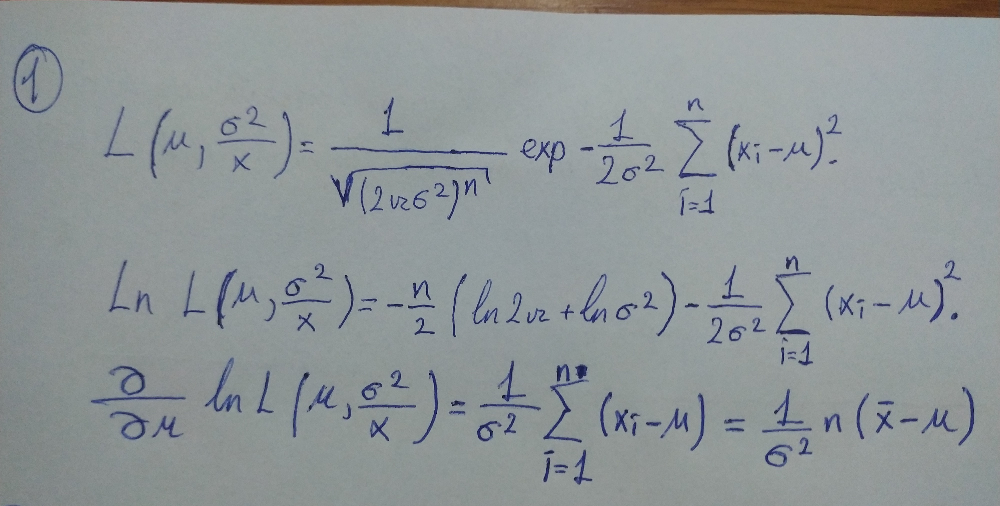

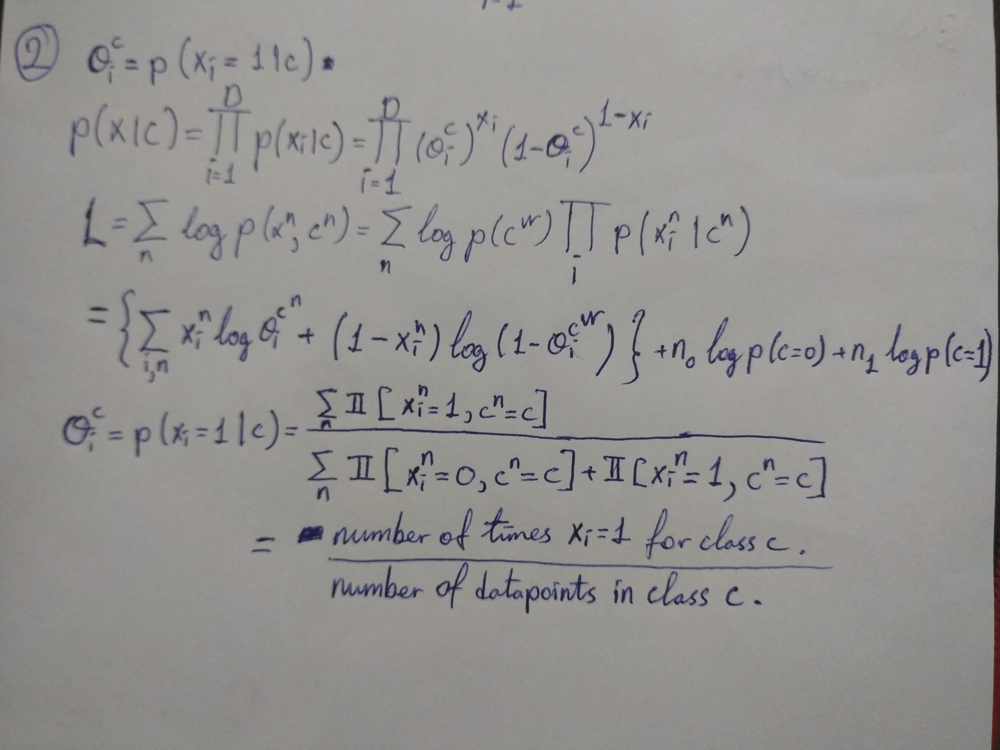

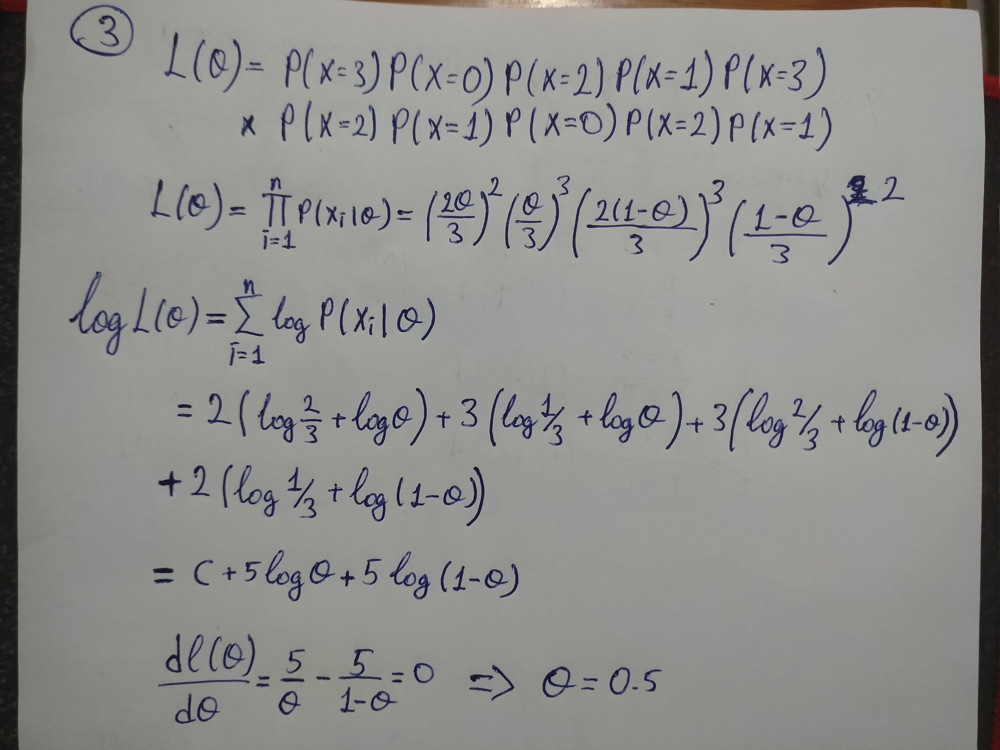

## Naive Bayes

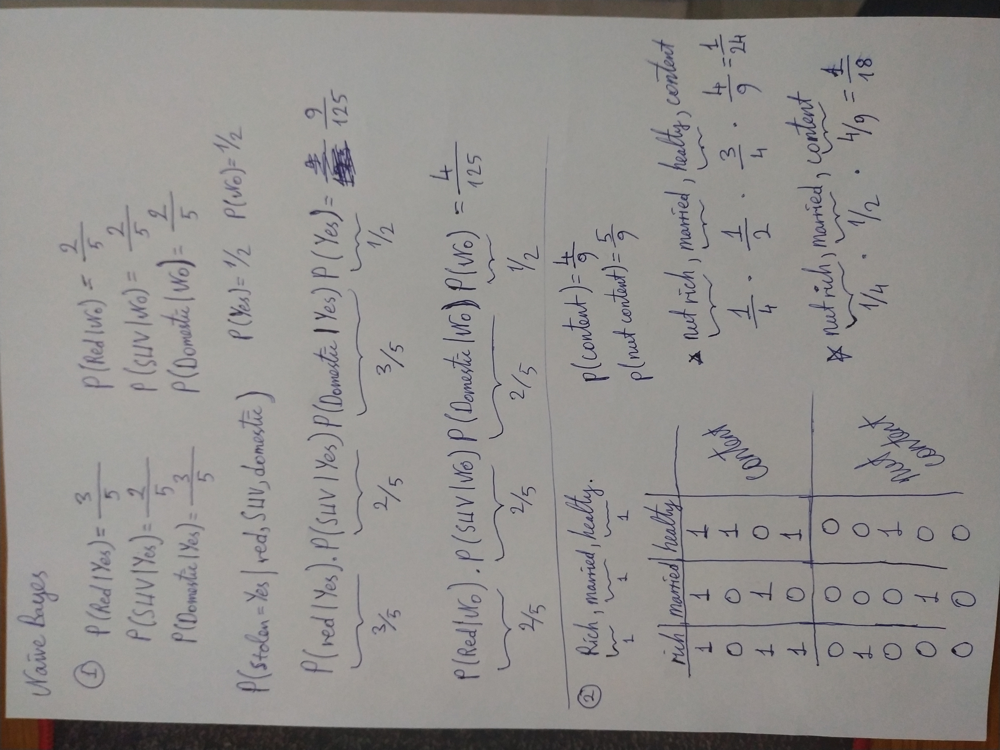

# PART II: Sentiment Analysis with Naive Bayes

### ALL CODES

In [1]:
import numpy as np
import pandas as pd
import datetime

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
from sklearn.model_selection import train_test_split


class NaiveBayes:
    def split_data(self):
        # train = df.sample(frac=0.8, random_state=200)  # random state is a seed value
        # test = df.drop(train.index)
        return train_test_split(self.data, train_size=0.8, test_size=0.2)

    def __init__(self, data=None, laplace_k=1, s_word_on_off=False, min_df=1):
        # all input table
        self.data = data
        # train len -> 9531 , test len -> 2383
        self.train, self.test = self.split_data()
        self.laplace_k = laplace_k
        # if true , stopword elimination will active
        self.s_word_on_off = s_word_on_off
        self.min_df = min_df

    def most_3(self, frequency):
        # sorted from small to large
        sorted_unigram_g0 = np.argsort(frequency, kind='heapsort', axis=None)
        sum_of_train_unigram_g0_frekans = np.sum(sorted_unigram_g0)

        # Frequency / Numbers of All Datas
        print(n_gram.get_feature_names()[sorted_unigram_g0.item(-1)], "= %",
              frequency.item(sorted_unigram_g0.item(-1)) / sum_of_train_unigram_g0_frekans,
              n_gram.get_feature_names()[sorted_unigram_g0.item(-2)], "= %",
              frequency.item(sorted_unigram_g0.item(-2)) / sum_of_train_unigram_g0_frekans,
              n_gram.get_feature_names()[sorted_unigram_g0.item(-3)], "= %",
              frequency.item(sorted_unigram_g0.item(-3)) / sum_of_train_unigram_g0_frekans
              )

    def n_gram_function(self, data, ng_input, element):
        # CountVectorizer()is a object, dont delete object variable name
        global n_gram
        # stopword countVectorizer
        if self.s_word_on_off:
            n_gram = CountVectorizer(stop_words=ENGLISH_STOP_WORDS, ngram_range=(ng_input, ng_input), min_df=self.min_df)
        # normal vectorizer
        else:
            n_gram = CountVectorizer(ngram_range=(ng_input, ng_input), min_df=self.min_df)
        # fit values
        x1 = n_gram.fit_transform(data[element].values)
        # matrix form
        return x1
    # understanding DATA
    def part1(self):
        # grouped by sentiment_category and document_tokens
        g_data = self.data[["sentiment_category", "document_tokens"]]
        # 0 is neg 1 is pos -> grouped by positive or negative
        group0 = g_data[g_data.sentiment_category == "neg"]
        group1 = g_data[g_data.sentiment_category == "pos"]

        for i in [group0, group1]:
            for j in [1, 2]:
                if pd.DataFrame.equals(group0, i) and j == 1:
                    print("Specific 3 title keywords of unigram negative group:")
                elif pd.DataFrame.equals(group0, i) and j == 2:
                    print("Specific 3 title keywords of bigram negative group:")
                elif pd.DataFrame.equals(group1, i) and j == 1:
                    print("Specific 3 title keywords of unigram positive group:")
                elif pd.DataFrame.equals(group1, i) and j == 2:
                    print("Specific 3 title keywords of bigram positive group:")

                n_gram_data = self.n_gram_function(i, j, "document_tokens")
                unigram_g0_frekans = n_gram_data.sum(axis=0)
                self.most_3(unigram_g0_frekans)

    def n_gram_function2(self, data, ng_input):
        # CountVectorizer()is a object, dont delete object variable name
        global n_gram
        try:
            if self.s_word_on_off:
                n_gram = CountVectorizer(stop_words=ENGLISH_STOP_WORDS, ngram_range=(ng_input, ng_input))
            else:
                n_gram = CountVectorizer(ngram_range=(ng_input, ng_input))
            x1 = n_gram.fit_transform(data)
            # matrix form
            return x1
        except:
            return None

    # P(w|c) = (count(w,c)+ laplace_k ) / count(c)+ laplace_k * unique words size
    def sum_frequency(self, freq, all_freq, data):
        # if no frequency
        if freq is None:
            freq = 0
        return (freq + self.laplace_k) / (all_freq + self.laplace_k * data)

    def naive_bayes(self, test_document_tokens, i, prior_neg, prior_pos, train_0_zipped, train_1_zipped,
                    all_train_0_frekans, all_train_1_frekans, len_train_0_frekans, len_train_1_frekans):
        p_negative = 0
        p_positive = 0
        test = self.n_gram_function2([test_document_tokens], i)
        if test is not None:
            test_frekans = test.sum(axis=0)
            test_feature = n_gram.get_feature_names()

            for j in range(len(test_feature)):
                # test words
                test_index = test_feature[j]
                # frequency of test word
                freq = test_frekans.item(j)
                # negative value
                # test word index
                neg_value = train_0_zipped.get(test_index)
                freq0 = self.sum_frequency(neg_value, all_train_0_frekans, len_train_0_frekans)
                p_negative += freq * np.log10(freq0)

                # positive value

                # test word index
                pos_index = train_1_zipped.get(test_index)
                freq1 = self.sum_frequency(pos_index, all_train_1_frekans, len_train_1_frekans)
                p_positive += freq * np.log10(freq1)

        # effect of priors
        # effect of priors
        p_negative += np.log10(prior_neg)
        p_positive += np.log10(prior_pos)
        return "neg" if p_negative > p_positive else "pos"

    def part2(self):
        # grouped train by sentiment_category and document_tokens
        g_train = self.train[["sentiment_category", "document_tokens"]]
        # 0 is neg 1 is pos
        g_train_0 = g_train[g_train.sentiment_category == "neg"]
        g_train_1 = g_train[g_train.sentiment_category == "pos"]
        # priors len fake / all train data or len real / all train data
        prior_neg = len(g_train_0) / len(g_train)
        prior_pos = len(g_train_1) / len(g_train)

        # 1 is unigram 2 is bigram
        for i in [1, 2]:
            # negative unigram for train data
            train_0 = self.n_gram_function(g_train_0, i, "document_tokens")
            # frequency of every word
            train_0_frekans = train_0.toarray().sum(axis=0)
            # sum of frequencies
            all_train_0_frekans = np.sum(train_0_frekans)
            # words
            train_0_feature = n_gram.get_feature_names()
            train_0_zipped = dict(zip(train_0_feature, train_0_frekans))

            # positive unigram for train data
            train_1 = self.n_gram_function(g_train_1, i, "document_tokens")
            # frequency of every word
            train_1_frekans = train_1.toarray().sum(axis=0)
            # sum of frequencies
            all_train_1_frekans = np.sum(train_1_frekans)
            # words
            train_1_feature = n_gram.get_feature_names()
            train_1_zipped = dict(zip(train_1_feature, train_1_frekans))

            test_data = self.test[["sentiment_category", "document_tokens"]]
            # 0 is negative 1 is positive
            len_train_0_frekans = len(train_0_feature)
            len_train_1_frekans = len(train_1_feature)

            # real unigram for test data
            test_result = 0
            for j in range(len(test_data)):
                # calculate naive_bayes
                res = self.naive_bayes(test_data.iloc[j].document_tokens, i, prior_neg, prior_pos, train_0_zipped,
                                       train_1_zipped, all_train_0_frekans,
                                       all_train_1_frekans, len_train_0_frekans, len_train_1_frekans)
                # for real text group and unigram
                if res == test_data.iloc[j].sentiment_category:
                    test_result += 1

            if i == 1:
                print("Unigram Accuracy= %", (test_result / len(test_data)) * 100)
            elif i == 2:
                print("Bigram Accuracy= %", (test_result / len(test_data)) * 100)

    # print presence most strongly predicts or absence most strongly predicts
    def find_n_number(self, frequency, text):
        # ascending sort
        sorted_unigram = np.argsort(frequency, kind='heapsort', axis=None)
        print()
        print("List the 10 words whose presence most strongly predicts that the news is", text + ".")
        for i in sorted_unigram[-10:]:
            print(n_gram.get_feature_names()[i], end=" ")
        print("\n")
        print("List the 10 words whose absence most strongly predicts that the news is", text + ".")
        for i in sorted_unigram[:10]:
            print(n_gram.get_feature_names()[i], end=" ")
        print()

    def part4(self):
        g_data = self.data[["sentiment_category", "document_tokens"]]
        # 0 is neg 1 is pos
        g_train_0 = g_data[g_data.sentiment_category == "neg"]
        g_train_1 = g_data[g_data.sentiment_category == "pos"]
        transformer = TfidfTransformer()

        unigram_g1 = self.n_gram_function(g_train_1, 1, "document_tokens")
        counts_unigram_g1 = unigram_g1.toarray()
        # Each row is normalized to have unit Euclidean norm
        tfidf_group1 = transformer.fit_transform(counts_unigram_g1)
        self.find_n_number(transformer.idf_, "positive")

        unigram_g0 = self.n_gram_function(g_train_0, 1, "document_tokens")
        counts_unigram_g0 = unigram_g0.toarray()
        # Each row is normalized to have unit Euclidean norm
        tfidf_group0 = transformer.fit_transform(counts_unigram_g0)
        self.find_n_number(transformer.idf_, "negative")


def main():
    file1 = open('all_sentiment_shuffled.txt', 'r', encoding='utf-8')
    data_line = []
    # reads input
    for i in file1.readlines():
        i = i.rstrip("\n")
        i = i.split(' ')
        # list to string
        combine_line = " ".join(i[3:])
        data_line.append([i[0], i[1], i[2], combine_line])
    # list to dataframe
    columns = ["category", "sentiment_category", "document_identifier", "document_tokens"]
    dataframe = pd.DataFrame(data=data_line, columns=columns)
    # naivebayes object
    object1 = NaiveBayes(data=dataframe, laplace_k=1, s_word_on_off=True, min_df=1)
    # Timer starts
    start_a = datetime.datetime.now()
    # process part1 understanding DATA
    object1.part1()
    b = datetime.datetime.now()
    print("\npart1 finished", b - start_a, " ms", (b - start_a).seconds, " second\n")

    a = datetime.datetime.now()
    # process part2 Implementing Naive Bayes
    object1.part2()
    b = datetime.datetime.now()
    print("\npart2 finished", b - a, " ms", (b - a).seconds, " second")
    a = datetime.datetime.now()
    # process part4 Modul Analysis
    object1.part4()
    b = datetime.datetime.now()
    print("\npart4 finished", b - a, " ms", (b - a).seconds, " second\n")

    # Program and Timer end
    b = datetime.datetime.now()
    print("program finished", b - start_a, " ms", (b - start_a).seconds, " second")


main()


Specific 3 title keywords of unigram negative group:
the = % 7.97970214204378e-05 to = % 4.123730832062832e-05 and = % 3.969359270862562e-05
Specific 3 title keywords of bigram negative group:
of the = % 9.109315503510404e-08 in the = % 5.733199830629627e-08 it is = % 3.667595408064909e-08
Specific 3 title keywords of unigram positive group:
the = % 7.291553428096816e-05 and = % 4.0786094551407264e-05 to = % 3.450712019524465e-05
Specific 3 title keywords of bigram positive group:
of the = % 9.304302037262999e-08 in the = % 5.195719235879091e-08 it is = % 3.983384747507303e-08

part1 finished 0:00:05.764015  ms 5  second

Unigram Accuracy= % 81.66177087704574
Bigram Accuracy= % 85.69030633655058

part2 finished 0:00:19.654834  ms 19  second

List the 10 words whose presence most strongly predicts that the news is positive.
400d 1616 104 ½kerlund ½lan ½sistance áron árpád 09 00am 

List the 10 words whose absence most strongly predicts that the news is positive.
the and to this is it of

## Some Results
### object1 = NaiveBayes(data=dataframe, laplace_k=1, s_word_on_off=False, min_df=1)

* Unigram Accuracy= % 79.31179185900126

* Bigram Accuracy= % 84.76710029374738


### object1 = NaiveBayes(data=dataframe, laplace_k=1, s_word_on_off=True, min_df=1)

* Unigram Accuracy= % 80.61267310113303

* Bigram Accuracy= % 76.71002937473772

### object1 = NaiveBayes(data=dataframe, laplace_k=1, s_word_on_off=False, min_df=5)

* Unigram Accuracy= % 80.15107007973144

* Bigram Accuracy= % 80.0251783466219

### object1 = NaiveBayes(data=dataframe, laplace_k=1, s_word_on_off=True, min_df=5)

* Unigram Accuracy= % 79.89928661351237

* Bigram Accuracy= % 68.77885018883761

## 1. Understanding the data

In [14]:
file1 = open('all_sentiment_shuffled.txt', 'r', encoding='utf-8')
data_line = []
for i in file1.readlines():
    i = i.rstrip("\n")
    i = i.split(' ')
    # list to string
    combine_line = " ".join(i[3:])
    data_line.append([i[0], i[1], i[2], combine_line])
# Timer starts
columns = ["category", "sentiment_category", "document_identifier", "document_tokens"]
dataframe = pd.DataFrame(data=data_line, columns=columns)
object1 = NaiveBayes(data=dataframe, laplace_k=1, s_word_on_off=True, min_df=5)
start_a = datetime.datetime.now()
# process part1 understanding DATA
object1.part1()
b = datetime.datetime.now()
print("\npart1 finished", b - start_a, " ms", (b - start_a).seconds, " second\n")

Specific 3 title keywords of unigram negative group:
like = % 9.182111918917951e-05 just = % 8.564116430219967e-05 book = % 7.890826608322689e-05
Specific 3 title keywords of bigram negative group:
waste money = % 2.4696824298954024e-05 does work = % 2.4253168772625507e-05 customer service = % 2.2774317018197124e-05
Specific 3 title keywords of unigram positive group:
great = % 7.84901887264092e-05 like = % 7.320959880014998e-05 book = % 6.608548931383578e-05
Specific 3 title keywords of bigram positive group:
easy use = % 5.66027403082622e-05 highly recommend = % 4.475090298739864e-05 years ago = % 2.8607883188291366e-05

part1 finished 0:00:02.265515  ms 2  second



* stopwords are words that occur frequently in sentences.

* If they are not filtered, the effect of unique words will decrease since their frequency will be high and their probability will be higher.

* Increasing mindf will increase the probability of words as it will decrease the number of words.

# 2. Implementing Naive Bayes

In [2]:
file1 = open('all_sentiment_shuffled.txt', 'r', encoding='utf-8')
data_line = []
for i in file1.readlines():
    i = i.rstrip("\n")
    i = i.split(' ')
    # list to string
    combine_line = " ".join(i[3:])
    data_line.append([i[0], i[1], i[2], combine_line])
# Timer starts
columns = ["category", "sentiment_category", "document_identifier", "document_tokens"]
dataframe = pd.DataFrame(data=data_line, columns=columns)
object1 = NaiveBayes(data=dataframe, laplace_k=1, s_word_on_off=True, min_df=1)

a = datetime.datetime.now()
# process part2 Implementing Naive Bayes
object1.part2()
b = datetime.datetime.now()
print("\npart2 finished", b - a, " ms", (b - a).seconds, " second")

Unigram Accuracy= % 80.23499790180445
Bigram Accuracy= % 76.71002937473772

part2 finished 0:00:15.987586  ms 15  second


# 3. Error Analysis

* Naive Bayes algorithm makes an assumption as all the variables in the dataset is “Naive” i.e not correlated to each other.

* Since naive bayes are independent, they will have a hard time reflecting the results in real life. In order for such a situation to occur, a very large data is needed.

* Due to the naive bayes formula, false predictions occur. because when probabilities are multiplied, very small values appear.

*  In the dataset, meaningless characters make up meaningless words that are not Stopwords.Therefore, there are errors in the results.

* Because the dataset is small and word diversity is low, accuracy is low.

* Including larger and different words in the dataset will provide more accurate results and easier classification.

* Data wastage caused by dividing the dataset into 80% and 20% reduces accuracy. Because of this waste, the naive bayes algorithm can make wrong predictions.

* The effect of the naive bayes method when classifying can make it difficult to predict. Other methods may produce better results. Example Chi Square

* sentiment category label has 2 class. Therefore, he cannot make his predictions well. It will work better in multi-class predictions.

* A low or too large Laplace value decreases accuracy. laplace = 10 can give better results

* The effect of stopwords words can affect the result. Stopwords words positively affected the bigram result more. This is because most of the sentences are made up of Stopwords. Due to the low frequency of words other than stopwords, the naive bayes algorithm can be mistaken in the bigram calculation.


* There are errors due to some sentences in the dataset being too short. It means that the words formed as a result of the countvectorizer are not both positive and negative. Therefore, the effect of probability and unique words is more. The effect may be less due to the low probability of the word not in train data, but it misleads the result due to the small number of words contained in the sentence. Sample lines are as follows.

        line 1191 "it 's a beu" 

        line 4977 "terrib"

        line 11472 "goo"


* The example lines above cannot create binary words in bigram as a result of the operation. (StopWords feature is turned on) so the naive bayes only chooses who is higher in the prior. Because dataset is insufficient and naive bayes is simple, it makes it wrong in such cases. 


# 4. Modul Analysis

In [9]:
file1 = open('all_sentiment_shuffled.txt', 'r', encoding='utf-8')
data_line = []
for i in file1.readlines():
    i = i.rstrip("\n")
    i = i.split(' ')
    # list to string
    combine_line = " ".join(i[3:])
    data_line.append([i[0], i[1], i[2], combine_line])
# Timer starts
columns = ["category", "sentiment_category", "document_identifier", "document_tokens"]
dataframe = pd.DataFrame(data=data_line, columns=columns)
object1 = NaiveBayes(data=dataframe, laplace_k=1, s_word_on_off=True, min_df=3)

a = datetime.datetime.now()
# process part4 Modul Analysis
object1.part4()
b = datetime.datetime.now()
print("\npart4 finished", b - a, " ms", (b - a).seconds, " second\n")


List the 10 words whose presence most strongly predicts that the news is positive.
fab clic ez principals principal eyewitness cleveland primes pricy clears 

List the 10 words whose absence most strongly predicts that the news is positive.
great like just good time use really does best love 

List the 10 words whose presence most strongly predicts that the news is negative.
barbie questioned filmography filmmaking cocktail coby quantaray qualify ahhhh 240 

List the 10 words whose absence most strongly predicts that the news is negative.
just like good does did time better really book use 

part4 finished 0:00:03.350750  ms 3  second



* NaiveBayes(data=dataframe, laplace_k=1, s_word_on_off=True, min_df=1)

Example result when the StopWords elimination feature is turned off:

List the 10 words whose presence most strongly predicts that the news is positive.

* 400d 1616 104 ½kerlund ½lan ½sistance áron árpád 09 00am 

List the 10 words whose absence most strongly predicts that the news is positive.

* the and to this is it of for in that 

List the 10 words whose presence most strongly predicts that the news is negative.

* zzzzzzzz breeds diaz diatribing breeding 114mm ½ve 0m único 000mb 

List the 10 words whose absence most strongly predicts that the news is negative.

* the and to this it of is for in that 


Example result when the StopWords elimination feature is turned on:

List the 10 words whose presence most strongly predicts that the news is positive.

* 400d ½ce ½cor ½kerlund 1616 ½sistance 104 árpád 09 00am 

List the 10 words whose absence most strongly predicts that the news is positive.

* great like just good time use really does best love 

List the 10 words whose presence most strongly predicts that the news is negative.

* zzzzzzzz difinite legecy brill acrylics 114mm ½ve 0m único 000mb 

List the 10 words whose absence most strongly predicts that the news is negative.

* just like good does did time better really book use 

**I think stopwords should be removed from sentences.
Memory savings and performance savings are achieved due to reduced data noise in BOW.
It turns out which words are meaningful and important for the dataset.**